In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/playground-series-s4e2/sample_submission.csv
/kaggle/input/playground-series-s4e2/train.csv
/kaggle/input/playground-series-s4e2/test.csv


In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
# Suppress all warnings globally for the entire notebook
warnings.filterwarnings("ignore")

In [3]:
df=pd.read_csv('/kaggle/input/playground-series-s4e2/train.csv')
data=df.copy()
df.head()

,id,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,0,Male,24.443011,1.699998,81.669950,yes,yes,2.000000,2.983297,Sometimes,no,2.763573,no,0.000000,0.976473,Sometimes,Public_Transportation,Overweight_Level_II
1,1,Female,18.000000,1.560000,57.000000,yes,yes,2.000000,3.000000,Frequently,no,2.000000,no,1.000000,1.000000,no,Automobile,Normal_Weight
2,2,Female,18.000000,1.711460,50.165754,yes,yes,1.880534,1.411685,Sometimes,no,1.910378,no,0.866045,1.673584,no,Public_Transportation,Insufficient_Weight
3,3,Female,20.952737,1.710730,131.274851,yes,yes,3.000000,3.000000,Sometimes,no,1.674061,no,1.467863,0.780199,Sometimes,Public_Transportation,Obesity_Type_III
4,4,Male,31.641081,1.914186,93.798055,yes,yes,2.679664,1.971472,Sometimes,no,1.979848,no,1.967973,0.931721,Sometimes,Public_Transportation,Overweight_Level_II


In [4]:
df_test=pd.read_csv('/kaggle/input/playground-series-s4e2/test.csv')
df_test.shape

(13840, 17)

In [5]:
df.shape

(20758, 18)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20758 entries, 0 to 20757
Data columns (total 18 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              20758 non-null  int64  
 1   Gender                          20758 non-null  object 
 2   Age                             20758 non-null  float64
 3   Height                          20758 non-null  float64
 4   Weight                          20758 non-null  float64
 5   family_history_with_overweight  20758 non-null  object 
 6   FAVC                            20758 non-null  object 
 7   FCVC                            20758 non-null  float64
 8   NCP                             20758 non-null  float64
 9   CAEC                            20758 non-null  object 
 10  SMOKE                           20758 non-null  object 
 11  CH2O                            20758 non-null  float64
 12  SCC                             

In [7]:
df.isnull().sum()

id                                0
Gender                            0
Age                               0
Height                            0
Weight                            0
family_history_with_overweight    0
FAVC                              0
FCVC                              0
NCP                               0
CAEC                              0
SMOKE                             0
CH2O                              0
SCC                               0
FAF                               0
TUE                               0
CALC                              0
MTRANS                            0
NObeyesdad                        0
dtype: int64

In [8]:
df['NObeyesdad'].unique()

array(['Overweight_Level_II', 'Normal_Weight', 'Insufficient_Weight',
       'Obesity_Type_III', 'Obesity_Type_II', 'Overweight_Level_I',
       'Obesity_Type_I'], dtype=object)

*****Exploring data*****

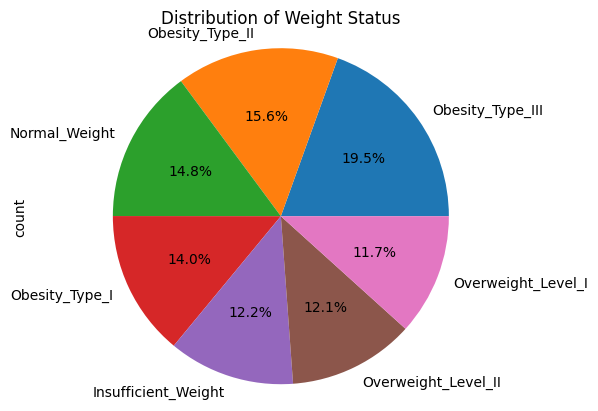

In [9]:
df['NObeyesdad'].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.title('Distribution of Weight Status')
plt.axis('equal')  # Equal aspect ratio ensures that the pie chart is circular.
plt.show()

In [10]:
df.columns

Index(['id', 'Gender', 'Age', 'Height', 'Weight',
       'family_history_with_overweight', 'FAVC', 'FCVC', 'NCP', 'CAEC',
       'SMOKE', 'CH2O', 'SCC', 'FAF', 'TUE', 'CALC', 'MTRANS', 'NObeyesdad'],
      dtype='object')

In [11]:
Categorical_columns=df.select_dtypes(include=['object']).columns
Categorical_columns

Index(['Gender', 'family_history_with_overweight', 'FAVC', 'CAEC', 'SMOKE',
       'SCC', 'CALC', 'MTRANS', 'NObeyesdad'],
      dtype='object')

In [12]:
df.drop(columns=['id'],inplace=True)
df.describe()

,Age,Height,Weight,FCVC,NCP,CH2O,FAF,TUE
count,20758.000000,20758.000000,20758.000000,20758.000000,20758.000000,20758.000000,20758.000000,20758.000000
mean,23.841804,1.700245,87.887768,2.445908,2.761332,2.029418,0.981747,0.616756
std,5.688072,0.087312,26.379443,0.533218,0.705375,0.608467,0.838302,0.602113
min,14.000000,1.450000,39.000000,1.000000,1.000000,1.000000,0.000000,0.000000
25%,20.000000,1.631856,66.000000,2.000000,3.000000,1.792022,0.008013,0.000000
50%,22.815416,1.700000,84.064875,2.393837,3.000000,2.000000,1.000000,0.573887
75%,26.000000,1.762887,111.600553,3.000000,3.000000,2.549617,1.587406,1.000000
max,61.000000,1.975663,165.057269,3.000000,4.000000,3.000000,3.000000,2.000000


**Gender vs NObeyesdad**

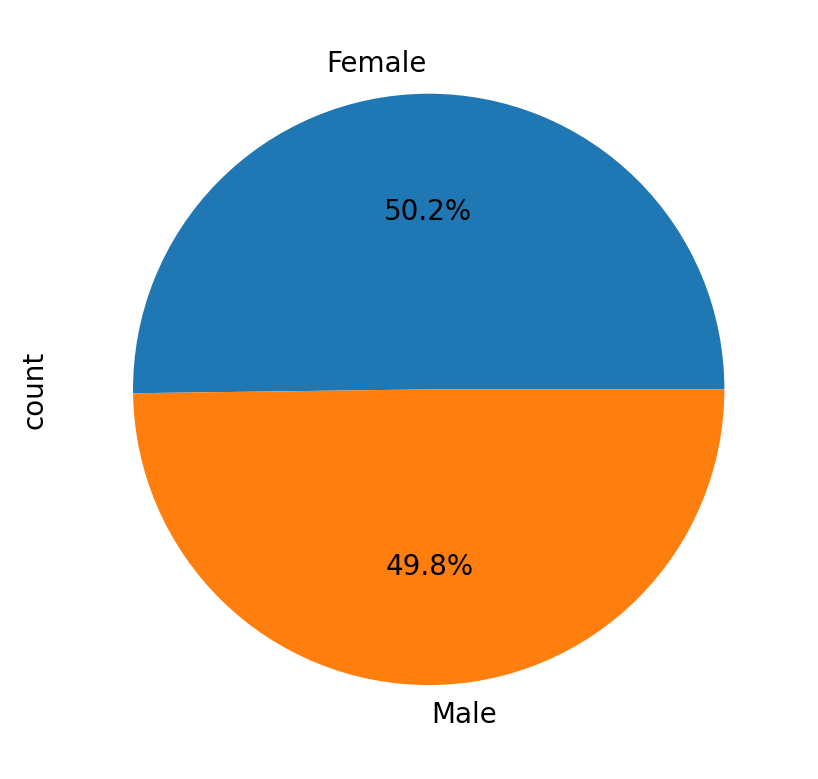

In [13]:
df['Gender'].value_counts().plot(kind='pie',autopct='%1.1f%%')
sns.set_style('darkgrid')
%config InlineBackend.figure_format = 'retina'

In [14]:
df.groupby('NObeyesdad')['Gender'].value_counts()

NObeyesdad           Gender
Insufficient_Weight  Female    1621
                     Male       902
Normal_Weight        Female    1660
                     Male      1422
Obesity_Type_I       Male      1643
                     Female    1267
Obesity_Type_II      Male      3240
                     Female       8
Obesity_Type_III     Female    4041
                     Male         5
Overweight_Level_I   Male      1357
                     Female    1070
Overweight_Level_II  Male      1767
                     Female     755
Name: count, dtype: int64

In [15]:
per_df=df.groupby('NObeyesdad')['Gender'].value_counts(normalize=True).mul(100).rename('Percentage').reset_index()

In [16]:
per_df

,NObeyesdad,Gender,Percentage
0,Insufficient_Weight,Female,64.248910
1,Insufficient_Weight,Male,35.751090
2,Normal_Weight,Female,53.861129
3,Normal_Weight,Male,46.138871
4,Obesity_Type_I,Male,56.460481
5,Obesity_Type_I,Female,43.539519
6,Obesity_Type_II,Male,99.753695
7,Obesity_Type_II,Female,0.246305
8,Obesity_Type_III,Female,99.876421
9,Obesity_Type_III,Male,0.123579


(array([0, 1, 2, 3, 4, 5, 6]),
 [Text(0, 0, 'Insufficient_Weight'),
  Text(1, 0, 'Normal_Weight'),
  Text(2, 0, 'Obesity_Type_I'),
  Text(3, 0, 'Obesity_Type_II'),
  Text(4, 0, 'Obesity_Type_III'),
  Text(5, 0, 'Overweight_Level_I'),
  Text(6, 0, 'Overweight_Level_II')])

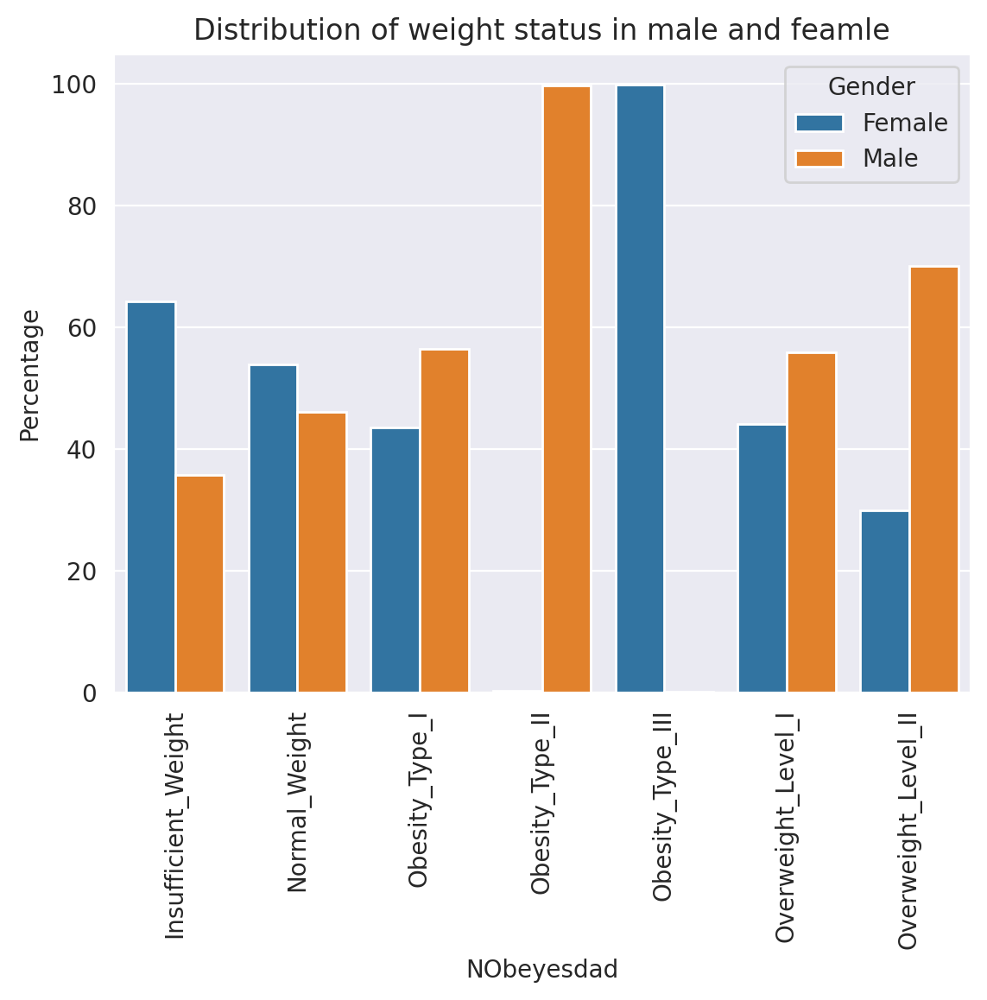

In [17]:
sns.barplot(x='NObeyesdad',y='Percentage',hue='Gender',data=per_df)
plt.title('Distribution of weight status in male and feamle')
plt.xticks(rotation='vertical')

Text(0.5, 1.0, 'Distribution of weight status within feamle')

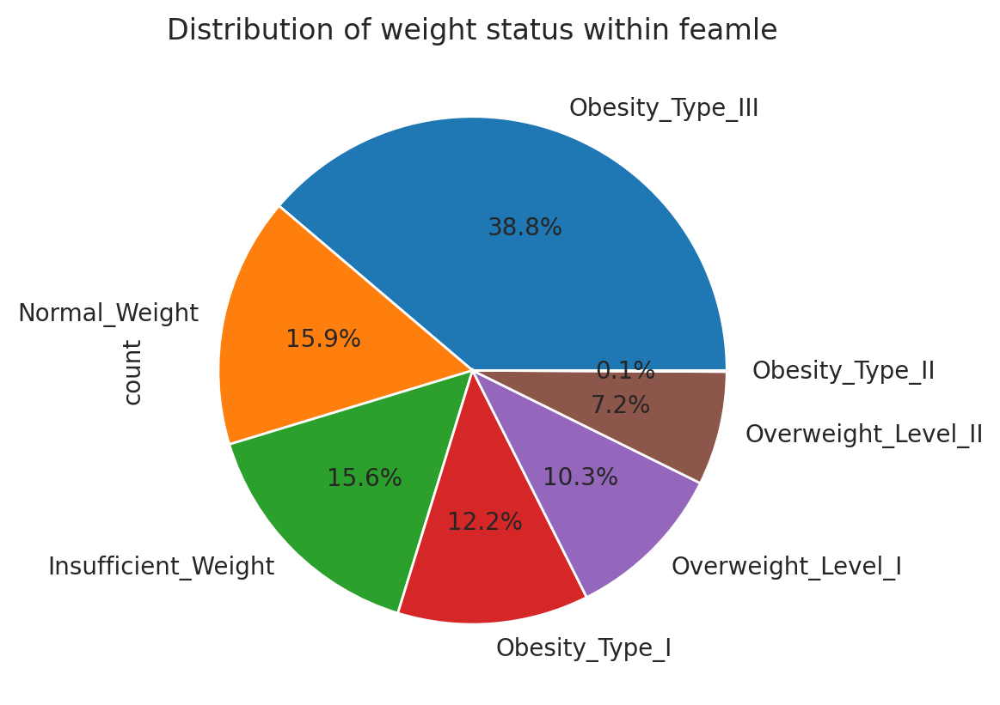

In [18]:
# percentage of weight status within feamle
data[data['Gender']=='Female']['NObeyesdad'].value_counts().plot(kind='pie',autopct='%1.1f%%')
plt.title('Distribution of weight status within feamle')
#(out of 100 feamles)

Text(0.5, 1.0, 'Distribution of weight status within Male')

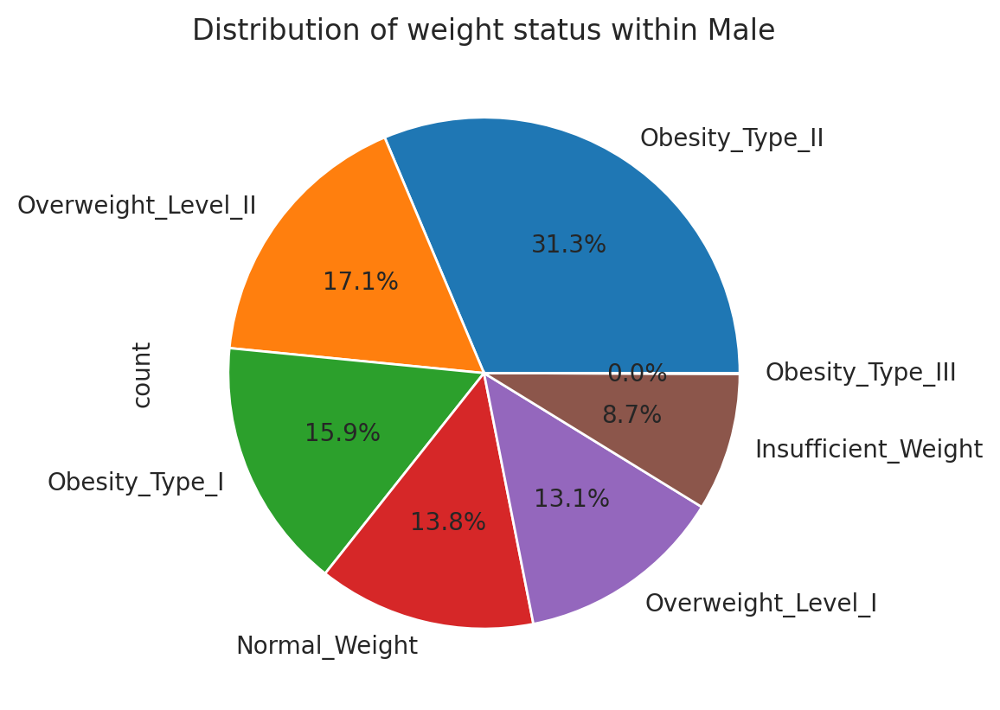

In [19]:
# within male
data[data['Gender']=='Male']['NObeyesdad'].value_counts().plot(kind='pie',autopct='%1.1f%%')
plt.title('Distribution of weight status within Male')
# out of 100 male

**2. Age vs Nobeyesdad**

In [20]:
data['Age'].describe()

count    20758.000000
mean        23.841804
std          5.688072
min         14.000000
25%         20.000000
50%         22.815416
75%         26.000000
max         61.000000
Name: Age, dtype: float64

<Axes: ylabel='Density'>

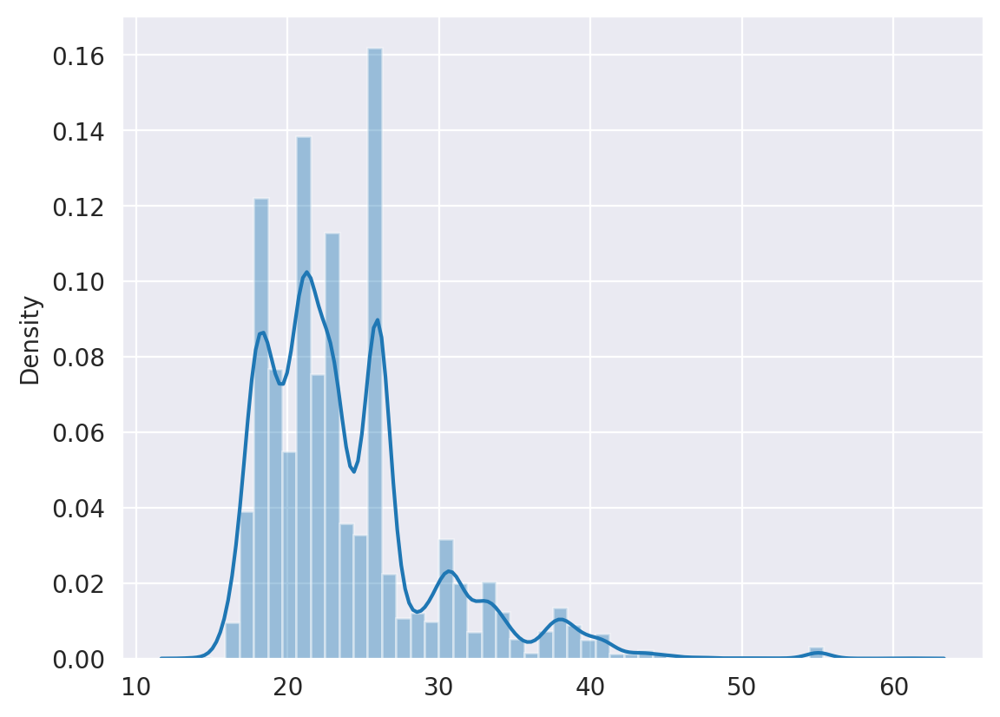

In [21]:
sns.distplot(x=(data['Age']),kde=True,hist=True)

<Axes: xlabel='Age'>

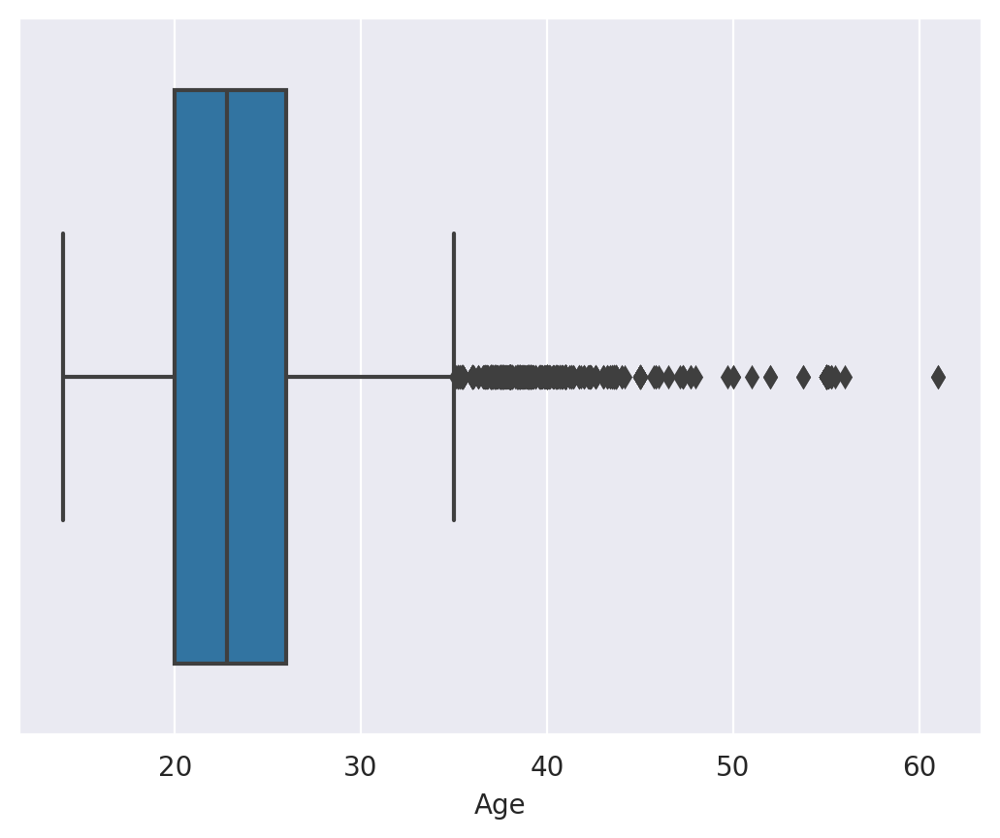

In [22]:
sns.boxplot(x=data['Age'])

(array([0, 1, 2, 3, 4, 5, 6]),
 [Text(0, 0, 'Overweight_Level_II'),
  Text(1, 0, 'Normal_Weight'),
  Text(2, 0, 'Insufficient_Weight'),
  Text(3, 0, 'Obesity_Type_III'),
  Text(4, 0, 'Obesity_Type_II'),
  Text(5, 0, 'Overweight_Level_I'),
  Text(6, 0, 'Obesity_Type_I')])

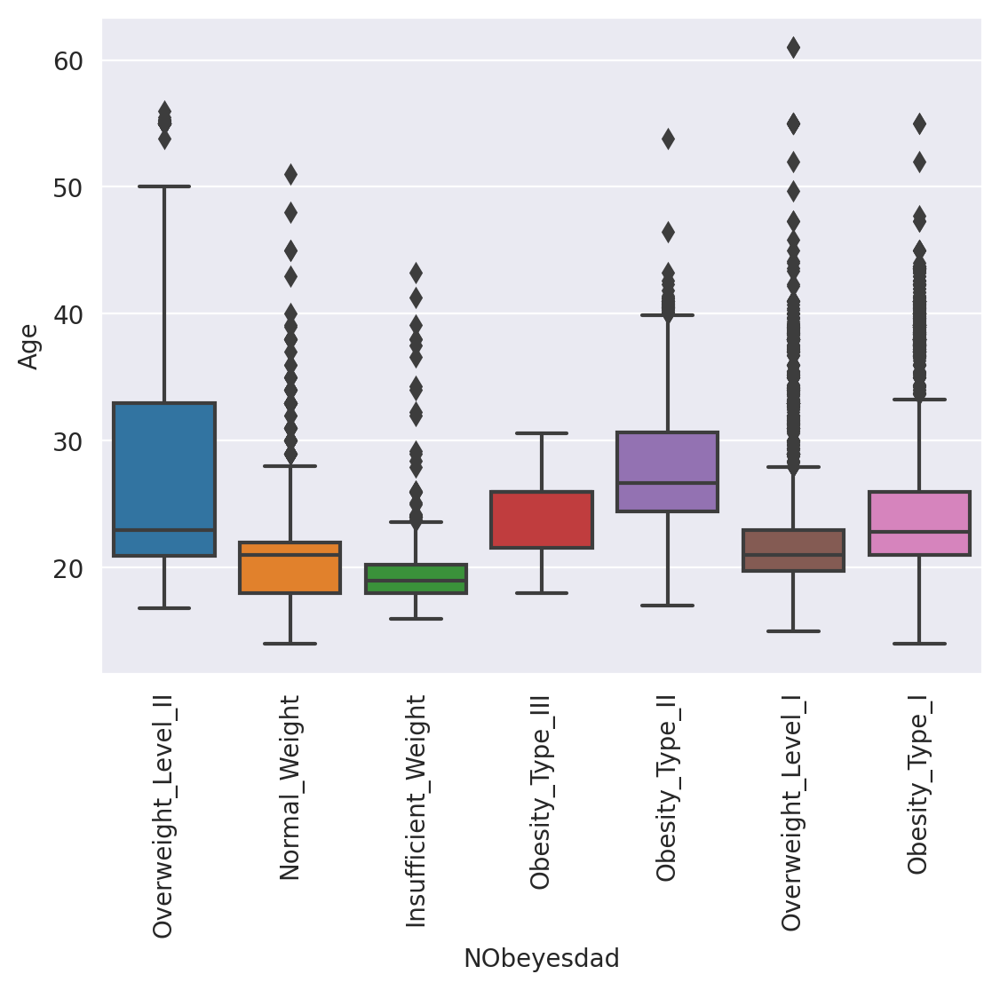

In [23]:
sns.boxplot(x=df['NObeyesdad'],y=df['Age'])
plt.xticks(rotation='vertical')

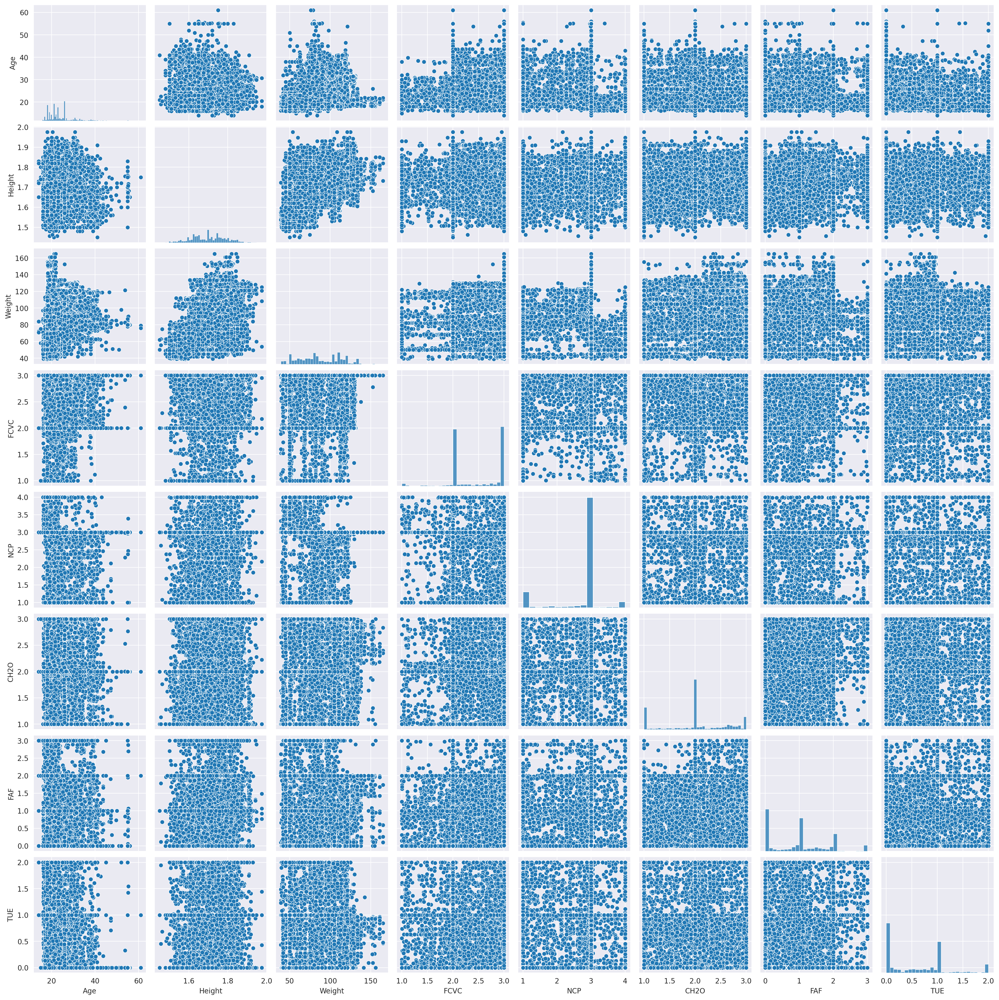

In [24]:
sns.pairplot(df)

In [25]:
bins=[13,21,40,61]
label=['teenager','adult','senior']
df['category_age']=pd.cut(df['Age'],bins=bins,labels=label)

In [26]:
df_test['category_age']=pd.cut(df_test['Age'],bins=bins,labels=label)

**Dropping duplicated rows**

In [27]:
df.drop_duplicates(inplace=True , keep="first")
df.shape

(20758, 18)

In [28]:
df.head()

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad,category_age
0,Male,24.443011,1.699998,81.669950,yes,yes,2.000000,2.983297,Sometimes,no,2.763573,no,0.000000,0.976473,Sometimes,Public_Transportation,Overweight_Level_II,adult
1,Female,18.000000,1.560000,57.000000,yes,yes,2.000000,3.000000,Frequently,no,2.000000,no,1.000000,1.000000,no,Automobile,Normal_Weight,teenager
2,Female,18.000000,1.711460,50.165754,yes,yes,1.880534,1.411685,Sometimes,no,1.910378,no,0.866045,1.673584,no,Public_Transportation,Insufficient_Weight,teenager
3,Female,20.952737,1.710730,131.274851,yes,yes,3.000000,3.000000,Sometimes,no,1.674061,no,1.467863,0.780199,Sometimes,Public_Transportation,Obesity_Type_III,teenager
4,Male,31.641081,1.914186,93.798055,yes,yes,2.679664,1.971472,Sometimes,no,1.979848,no,1.967973,0.931721,Sometimes,Public_Transportation,Overweight_Level_II,adult


<Axes: xlabel='NObeyesdad,category_age'>

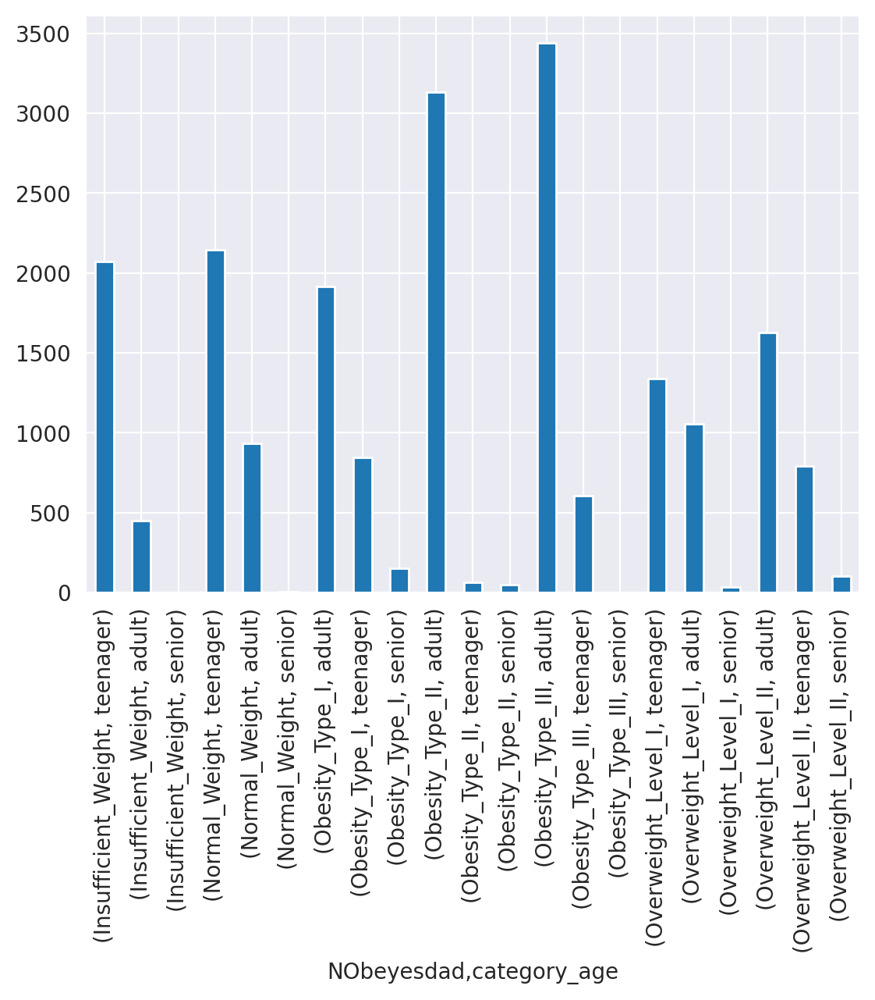

In [29]:
df.groupby('NObeyesdad')['category_age'].value_counts().plot(kind='bar')

**Feature Engineering**

In [30]:
df['BMI']=df['Weight']/(df['Height']**2)

In [31]:
df_test['BMI']=df_test['Weight']/(df_test['Height']**2)

<Axes: ylabel='Density'>

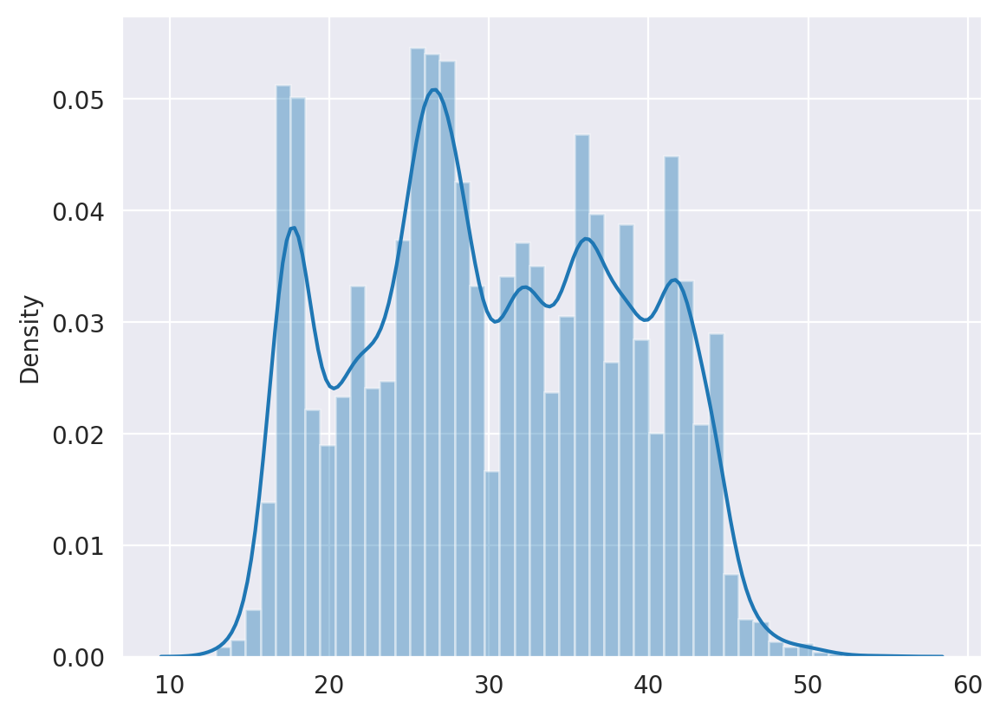

In [32]:
sns.distplot(x=df['BMI'])

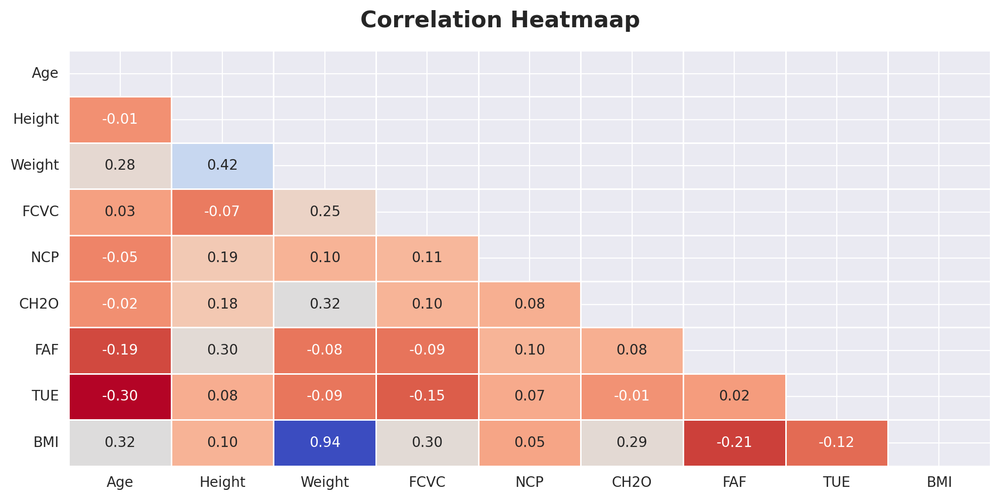

In [33]:
numeric_columns=df.select_dtypes(include='number')
corr = numeric_columns.corr(method='pearson')
mask = np.triu(np.ones_like(corr))
fig = plt.subplots(figsize=(10,5))
sns.heatmap(corr, annot=True,fmt='.2f',mask=mask,cmap='coolwarm_r', cbar=None, linewidth=1)
plt.suptitle('Correlation Heatmaap', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

****Chi2 Test****

In [34]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20758 entries, 0 to 20757
Data columns (total 19 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   Gender                          20758 non-null  object  
 1   Age                             20758 non-null  float64 
 2   Height                          20758 non-null  float64 
 3   Weight                          20758 non-null  float64 
 4   family_history_with_overweight  20758 non-null  object  
 5   FAVC                            20758 non-null  object  
 6   FCVC                            20758 non-null  float64 
 7   NCP                             20758 non-null  float64 
 8   CAEC                            20758 non-null  object  
 9   SMOKE                           20758 non-null  object  
 10  CH2O                            20758 non-null  float64 
 11  SCC                             20758 non-null  object  
 12  FAF               

In [35]:
categorical_Columns=df.select_dtypes(include=['object','category']).drop(columns=['NObeyesdad']).columns
categorical_Columns

Index(['Gender', 'family_history_with_overweight', 'FAVC', 'CAEC', 'SMOKE',
       'SCC', 'CALC', 'MTRANS', 'category_age'],
      dtype='object')

In [36]:
# chi2 test : It helps to know if two categorical variables are correlated to each other or not
from scipy.stats import chi2_contingency

for items in categorical_Columns:
  contigency_table=pd.crosstab(df[items],df['NObeyesdad'])
  chi2_stat, p_value, _, _ = chi2_contingency(contigency_table)
  if p_value < 0.05:
    print(f"The {items} is likely important.")
  else:
    print(f"The {items} may not be important.")

The Gender is likely important.
The family_history_with_overweight is likely important.
The FAVC is likely important.
The CAEC is likely important.
The SMOKE is likely important.
The SCC is likely important.
The CALC is likely important.
The MTRANS is likely important.
The category_age is likely important.


****ANOVA TEST****

In [37]:
from sklearn.preprocessing import LabelEncoder

In [38]:
le=LabelEncoder()
df['NObeyesdad']=le.fit_transform(df['NObeyesdad'])

In [39]:
numeric_columns

,Age,Height,Weight,FCVC,NCP,CH2O,FAF,TUE,BMI
0,24.443011,1.699998,81.669950,2.000000,2.983297,2.763573,0.000000,0.976473,28.259565
1,18.000000,1.560000,57.000000,2.000000,3.000000,2.000000,1.000000,1.000000,23.422091
2,18.000000,1.711460,50.165754,1.880534,1.411685,1.910378,0.866045,1.673584,17.126706
3,20.952737,1.710730,131.274851,3.000000,3.000000,1.674061,1.467863,0.780199,44.855798
4,31.641081,1.914186,93.798055,2.679664,1.971472,1.979848,1.967973,0.931721,25.599151
...,...,...,...,...,...,...,...,...,...
20753,25.137087,1.766626,114.187096,2.919584,3.000000,2.151809,1.330519,0.196680,36.587084
20754,18.000000,1.710000,50.000000,3.000000,4.000000,1.000000,2.000000,1.000000,17.099278
20755,20.101026,1.819557,105.580491,2.407817,3.000000,2.000000,1.158040,1.198439,31.889841
20756,33.852953,1.700000,83.520113,2.671238,1.971472,2.144838,0.000000,0.973834,28.899693


In [40]:
from scipy.stats import f_oneway

# Effectuer le test ANOVA
for item in numeric_columns:
    anova_results =f_oneway(df[item],df['NObeyesdad'])
    ANOVA_stat, p_value=anova_results
    if p_value < 0.05:
        print(f"The {item} may have significant differences.")
    else:
        print(f"The {item} may not have significant differences.")
    

The Age may have significant differences.
The Height may have significant differences.
The Weight may have significant differences.
The FCVC may have significant differences.
The NCP may have significant differences.
The CH2O may have significant differences.
The FAF may have significant differences.
The TUE may have significant differences.
The BMI may have significant differences.


****We will conserve all Features****

# Preprocessing

In [41]:
from sklearn.preprocessing import StandardScaler , OneHotEncoder , OrdinalEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

In [42]:
numeric_columns=df.select_dtypes(include='number').columns

In [43]:
for col in categorical_Columns :
    print(col,df[col].unique())

Gender ['Male' 'Female']
family_history_with_overweight ['yes' 'no']
FAVC ['yes' 'no']
CAEC ['Sometimes' 'Frequently' 'no' 'Always']
SMOKE ['no' 'yes']
SCC ['no' 'yes']
CALC ['Sometimes' 'no' 'Frequently']
MTRANS ['Public_Transportation' 'Automobile' 'Walking' 'Motorbike' 'Bike']
category_age ['adult', 'teenager', 'senior']
Categories (3, object): ['teenager' < 'adult' < 'senior']


In [44]:
X=df.drop(columns=['NObeyesdad'])
y=df['NObeyesdad']

In [45]:
Ordinal_features=['CAEC','CALC','category_age']
Nominal_features=['Gender','family_history_with_overweight','FAVC','SMOKE','SCC','MTRANS']

In [46]:
numeric_columns=['Age', 'Height', 'Weight', 'FCVC', 'NCP', 'CH2O', 'FAF', 'TUE','BMI']

In [47]:
preprocessing = ColumnTransformer([
    ('one_hot_encoding', OneHotEncoder(handle_unknown='ignore'), Nominal_features),
    ('Orinal_encoding',OrdinalEncoder(handle_unknown='use_encoded_value',unknown_value=5), Ordinal_features),
    ('scaling', StandardScaler(), numeric_columns)
])
pipeline=Pipeline(steps=[
    ('preprocessor', preprocessing)])

In [48]:
X_train_encoded=pipeline.fit_transform(X)

In [49]:
id=df_test.id
X_test=df_test
X_test_encoded=pipeline.transform(X_test)

In [50]:
X_train_encoded.shape

(20758, 27)

In [51]:
X_test_encoded.shape

(13840, 27)

# **Model Building**

In [52]:
from sklearn.model_selection import KFold, cross_val_score , GridSearchCV
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier

In [54]:
models = {
    'Logistic Regression': LogisticRegression(),
    'Naive Bayes': GaussianNB(),
    'K-Nearest Neighbors': KNeighborsClassifier(),  # Replaced DecisionTreeClassifier
    'Random Forest': RandomForestClassifier(),
    'Gradient Boosting': GradientBoostingClassifier(),
    'XGBoost': XGBClassifier(),
    'Support Vector Machine': SVC()
}

param_grids = {
    'Logistic Regression': {'penalty': ['l1', 'l2'], 'C': [0.1, 1.0, 10.0]},
    'Naive Bayes': {},  # Naive Bayes typically has no hyperparameters
    'K-Nearest Neighbors': {'n_neighbors': [5, 10, 20]},  # Common hyperparameter for KNN
    'Random Forest': {'n_estimators': [100, 200, 300], 'max_depth': [None, 10, 20]},
    'Gradient Boosting': {'n_estimators': [100, 200, 300], 'learning_rate': [0.05, 0.1, 0.2]},
    'XGBoost': {'n_estimators': [100, 200, 300], 'learning_rate': [0.05, 0.1, 0.2]},
    'Support Vector Machine': {'kernel': ['linear', 'rbf'], 'C': [0.1, 1.0, 10.0]}
}


In [55]:
kf = KFold(n_splits=5, shuffle=True, random_state=42)

In [59]:
results = []
grids = {}
for model_name, model in models.items():
    grids[model_name] = GridSearchCV(estimator=model, param_grid=param_grids[model_name], cv=kf, scoring='accuracy', n_jobs=-1, verbose=2)
    grids[model_name].fit(X_train_encoded, y)
    best_params =  grids[model_name].best_params_
    best_score =( grids[model_name].best_score_)
    results.append({'Model': model_name, 'Best Score': best_score})
 Créer un DataFrame à partir des résultats
results_df = pd.DataFrame(results)

In [60]:
results_df

In [61]:
grids['XGBoost'].best_params_

In [62]:
grids['XGBoost'].best_score_

In [63]:
model1=grids['XGBoost'].best_estimator_

In [64]:
model2=grids['Gradient Boosting'].best_estimator_
model3=grids['Random Forest'].best_estimator_

In [65]:
y_predicted1=model1.predict(X_test_encoded)
y_predicted2=model2.predict(X_test_encoded)
y_predicted3=model3.predict(X_test_encoded)

In [66]:
y_predicted1=le.inverse_transform(y_predicted1)
y_predicted2=le.inverse_transform(y_predicted2)
y_predicted3=le.inverse_transform(y_predicted3)

In [67]:
df_test['NObeyesdad']=y_predicted1
df_test[['id','NObeyesdad']].to_csv('submissionob1.csv',index=False)

In [68]:
df_test['NObeyesdad']=y_predicted2
df_test[['id','NObeyesdad']].to_csv('submissionob2.csv',index=False)

In [69]:
df_test['NObeyesdad']=y_predicted3
df_test[['id','NObeyesdad']].to_csv('submissionob3.csv',index=False)

In [70]:
results_df